In [1]:
# importujemy potrzebne pakiety

from collections import Counter, defaultdict
import codecs
import csv

from gensim.corpora import Dictionary
from gensim.models import Word2Vec
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans, AgglomerativeClustering
from wordcloud import WordCloud

In [2]:
PATH = 'beer_reviews.csv'
SCORE_THRESHOLD = 4 # recenzje z co najmniej taka ocena wezmiemy pod uwage
VECTOR_SIZE = 20 # jak dlugie powinny byc wektory osadzen uzytkownikow
SEGMENTS_COUNT = 10 # na ile segmentow chcemy podzielic populacje uzytkownikow

In [4]:
# wczytujemy dane

def parse_headers(column_names):
    beer_id_column =  column_names.index('beer_beerid')
    beer_style_column = column_names.index('beer_style')
    user_id_column =  column_names.index('review_profilename')
    score_column =  column_names.index('review_overall')
    return beer_id_column, beer_style_column, user_id_column, score_column


def parse_review(line, beer_id_column, beer_style_column, user_id_column, score_column):
    return line[beer_id_column], line[beer_style_column], line[user_id_column], float(line[score_column])

def read_and_parse_reviews(path, score_threshold):
    with codecs.open(PATH, 'r', 'UTF-8') as datafile:
        datareader = csv.reader(datafile)
        beer_id_column, beer_style_column, user_id_column, score_column = parse_headers(next(datareader))
    
        users_favourite_beers = defaultdict(list)
        for review in datareader:
            beer_id, _, user_id, score = parse_review(review, beer_id_column, beer_style_column, user_id_column, score_column)
            if score >= score_threshold:
                users_favourite_beers[user_id].append(beer_id)

    return users_favourite_beers

def get_beer_id_to_style_mapping(path):
    with codecs.open(PATH, 'r', 'UTF-8') as datafile:
        datareader = csv.reader(datafile)
        beer_id_column, beer_style_column, user_id_column, score_column = parse_headers(next(datareader))
        beer_styles = {}
        for review in datareader:
            beer_id, beer_style, _, _ = parse_review(review, beer_id_column, beer_style_column, user_id_column, score_column)
            beer_styles[beer_id] = beer_style
        return beer_styles

# otrzymujemy slownik - mapowanie z user_id na liste ulubionych beer_ids
users_favourite_beers = read_and_parse_reviews(PATH, SCORE_THRESHOLD)

# dodatkowo przygotujmy sobie slownik mapujacy id piwa na nazwe stylu
beer_styles = get_beer_id_to_style_mapping(PATH)

In [5]:
users_favourite_beers

defaultdict(list,
            {'johnmichaelsen': ['64883',
              '56980',
              '56115',
              '33624',
              '33624',
              '47695',
              '4373',
              '55614',
              '47658',
              '47658',
              '21822',
              '21822',
              '20478',
              '20478',
              '11757',
              '16074',
              '49077',
              '59966',
              '54827',
              '47659',
              '24905',
              '19960',
              '19960',
              '41843',
              '3606',
              '1324',
              '54731',
              '54731',
              '21704',
              '73411',
              '429',
              '21483',
              '5487',
              '5411',
              '5411',
              '30213',
              '1058',
              '50886',
              '50849',
              '10572',
              '39721',
              '45794',
       

In [6]:
beer_styles

{'47986': 'Hefeweizen',
 '48213': 'English Strong Ale',
 '48215': 'Foreign / Export Stout',
 '47969': 'German Pilsener',
 '64883': 'American Double / Imperial IPA',
 '52159': 'Herbed / Spiced Beer',
 '436': 'Light Lager',
 '10789': 'Oatmeal Stout',
 '12386': 'American Pale Lager',
 '58046': 'Rauchbier',
 '25414': 'American Pale Ale (APA)',
 '10788': 'American Porter',
 '58920': 'Belgian Strong Dark Ale',
 '10784': 'American IPA',
 '21241': 'American Stout',
 '20818': 'Russian Imperial Stout',
 '10786': 'American Amber / Red Ale',
 '10794': 'American Strong Ale',
 '54330': 'Märzen / Oktoberfest',
 '20817': 'American Adjunct Lager',
 '61427': 'American Blonde Ale',
 '3386': 'Euro Pale Lager',
 '55097': 'English Brown Ale',
 '2780': 'American Porter',
 '20689': 'Scotch Ale / Wee Heavy',
 '2725': 'American IPA',
 '33624': 'American IPA',
 '56071': 'American IPA',
 '10785': 'American Amber / Red Ale',
 '76963': 'American Porter',
 '23290': 'American Amber / Red Ale',
 '49803': 'German Pilse

In [7]:
# trenujemy model osadzajacy piwa i uzytkownikow w przestrzeni

model = Word2Vec(sentences=users_favourite_beers.values(), size=VECTOR_SIZE, window=5, min_count=1, workers=4)

In [8]:
# na podstawie modelu obliczamy wektorowa reprezentacje uzytkownikow

def get_mean_vector_for_user(user_favourite_beers, model, vector_size):
    # inicjalizujemy wektor zerami
    v = np.zeros(vector_size)
    
    # iterujemy po liscie user_favourite_beers, odczytujemy z modelu wektor reprezentujacy kazde piwo i dodajemy do wektora
    #   uzyj: model.wv[beer_id]
    # ...
#     print(v)
    for i, fav_beer in enumerate(user_favourite_beers):
#         print(np.sum(model.wv[fav_beer]))
        try:
            v += model.wv[fav_beer]
        except IndexError:
            print('there are more beers')
            break
    
    
    # normalizujemy wektor - dzielimy kazda wspolrzedna przez liczbe piw
    for i, val in enumerate(v):
        v[i] /= len(user_favourite_beers)
    # ...
#     print(v)
    
    return v


def get_mean_user_vectors(users_favourite_beers, model, vector_size):
    # korzystajac z powyzszej funkcji, tworzymy slownik {user_id -> vector}
    mean_users_vectors = {}
    for user in users_favourite_beers.keys():
        mean_users_vectors[user] = get_mean_vector_for_user(users_favourite_beers[user], model, vector_size)
    # ...
    return mean_users_vectors


# get_mean_vector_for_user(users_favourite_beers, model, VECTOR_SIZE)
user_vectors = get_mean_user_vectors(users_favourite_beers, model, VECTOR_SIZE)

In [10]:
# klastrujemy uzytkownikow - mozemy uzyc wielu algorytmow, np k-means, agglomerative, BIRCH, ...

def get_users_segmentation(user_vectors, vector_size, segments_count, clustering_algorithm):
    # rozkladamy slownik user_vectors na liste uzytkownikow i liste wektorow
    #  - wazne jest zachowanie tej samej kolejnosci w obu listach
    users = user_vectors.keys()# ...
    vectors = [user_vectors[user] for user in users]# ...
    
    # zamieniamy liste wektorow w macierz
    users_array = np.stack(vectors, axis=0)
    # zaimplementuj wsparcie dla co najmniej jednego algorytmu wiecej
    if clustering_algorithm == 'agglomerative':
        clustering = AgglomerativeClustering(n_clusters=segments_count).fit_predict(users_array)
        # clustering to lista przypisanych klastrow - i-ty element to klaster, do ktorego nalezy i-ty wektor
        
    segmentation = dict(zip(users, clustering))
    # jesli nie pomieszalismy kolejnosci w listach, to mozemy odzyskac mapping user_id -> cluster
    # ...
    return segmentation

segmentation = get_users_segmentation(user_vectors, VECTOR_SIZE, SEGMENTS_COUNT, 'agglomerative')

In [12]:
segmentation

{'johnmichaelsen': 8,
 'LordAdmNelson': 9,
 'augustgarage': 9,
 'MadeInOregon': 8,
 'rawthar': 9,
 'Halcyondays': 9,
 'beerguy101': 9,
 'UCLABrewN84': 9,
 'zaphodchak': 9,
 'Tilley4': 9,
 'mikedrinksbeer2': 9,
 'dbmernin83': 9,
 'titosupertramp': 9,
 'optimator13': 9,
 'Blakaeris': 9,
 'bashiba': 9,
 'Klym': 9,
 'flexabull': 9,
 'Bung': 9,
 'oberon': 9,
 't420o': 9,
 'DarthKostrizer': 9,
 'MrVonzipper': 9,
 'TheWhiskerReview': 9,
 'Jason': 8,
 'DoubleJ': 9,
 'Deuane': 8,
 'Mattybeerguy': 8,
 'micromaniac129': 9,
 'northyorksammy': 8,
 'vette2006c5r': 2,
 'EvanEngelstad': 8,
 'djeucalyptus': 9,
 'ccrida': 9,
 'brewandbbq': 9,
 'hopsbreath': 9,
 'Slatetank': 9,
 'Proteus93': 9,
 'SShelly': 9,
 'zoso1967': 9,
 'msubulldog25': 9,
 'NJpadreFan': 9,
 'd0ggnate': 9,
 'Cyberkedi': 9,
 'babyhobbes': 9,
 'mdagnew': 8,
 'mikesgroove': 8,
 'hdofu': 9,
 'GratefulBeerGuy': 9,
 'PDXHops': 9,
 'IMincedTheKing': 2,
 'Goliath': 9,
 'zeff80': 9,
 'akorsak': 9,
 'wchesak': 9,
 'bfields4': 9,
 'dyan': 9,
 

In [11]:
# obliczamy licznosci segmentow

def get_segment_sizes(segmentation):
    # ...
    return Counter(segmentation.values())

get_segment_sizes(segmentation)

Counter({0: 1027,
         1: 1926,
         2: 5347,
         3: 1257,
         4: 950,
         5: 1262,
         6: 774,
         7: 3009,
         8: 5116,
         9: 9618})

## Część 4. - opisy segmentów

In [28]:
# obliczamy popularnosc styli w segmentach oraz w calej populacji
#  - czyli jak czesto kazdy ze styli wystepowal

def get_per_segment_styles_popularity(users_favourite_beers, beer_styles, segmentation, segments_count):
    beer_styles_per_segment = {i: defaultdict(lambda: 0) for i in range(segments_count)}
    # do tego slownika bedziemy sie odwolywac np. tak: beer_styles_per_segment[segment][style]
    
    for user, beers in users_favourite_beers.items():
      for beer in beers:
        beer_styles_per_segment[segmentation[user]][beer_styles[beer]] += 1
        # ...
    
    return beer_styles_per_segment

def get_total_styles_popularity(beer_styles_per_segment):
    total_popularity = defaultdict(lambda: 0)
    print(beer_styles_per_segment)
    for d in beer_styles_per_segment:
      # print(d)
      # print()
      for name, count in beer_styles_per_segment[d].items():
        total_popularity[name] += count
    # ...
    return total_popularity

per_segment_styles_popularity = get_per_segment_styles_popularity(users_favourite_beers, beer_styles, segmentation, SEGMENTS_COUNT)
total_styles_popularity = get_total_styles_popularity(per_segment_styles_popularity)

{0: defaultdict(<function get_per_segment_styles_popularity.<locals>.<dictcomp>.<lambda> at 0x7f168d4a2b90>, {'English Pale Ale': 3, 'Dubbel': 25, 'Schwarzbier': 14, 'Doppelbock': 65, 'American Pale Ale (APA)': 19, 'Bock': 32, 'Munich Helles Lager': 6, 'Kölsch': 3, 'Tripel': 34, 'Dunkelweizen': 15, 'American Adjunct Lager': 9, 'Belgian Strong Pale Ale': 84, 'American Double / Imperial IPA': 153, 'American IPA': 104, 'Weizenbock': 4, 'American Porter': 29, 'Flanders Red Ale': 12, 'Pumpkin Ale': 2, 'Munich Dunkel Lager': 9, 'Hefeweizen': 62, 'Winter Warmer': 9, 'Witbier': 39, 'Fruit / Vegetable Beer': 6, 'American Wild Ale': 2, 'Märzen / Oktoberfest': 18, 'American Barleywine': 8, 'Czech Pilsener': 4, 'English Bitter': 2, 'English Brown Ale': 10, 'Old Ale': 5, 'American Pale Wheat Ale': 28, 'Kristalweizen': 3, 'Belgian Pale Ale': 17, 'American Stout': 20, 'Belgian Strong Dark Ale': 15, 'Saison / Farmhouse Ale': 30, 'Rauchbier': 1, 'Scottish Gruit / Ancient Herbed Ale': 12, 'English Barle

In [29]:
per_segment_styles_popularity

{0: defaultdict(<function __main__.get_per_segment_styles_popularity.<locals>.<dictcomp>.<lambda>>,
             {'Altbier': 1,
              'American Adjunct Lager': 9,
              'American Amber / Red Ale': 14,
              'American Amber / Red Lager': 3,
              'American Barleywine': 8,
              'American Black Ale': 34,
              'American Brown Ale': 6,
              'American Double / Imperial IPA': 153,
              'American Double / Imperial Stout': 11,
              'American IPA': 104,
              'American Pale Ale (APA)': 19,
              'American Pale Lager': 3,
              'American Pale Wheat Ale': 28,
              'American Porter': 29,
              'American Stout': 20,
              'American Strong Ale': 92,
              'American Wild Ale': 2,
              'Baltic Porter': 1,
              'Belgian Dark Ale': 7,
              'Belgian IPA': 18,
              'Belgian Pale Ale': 17,
              'Belgian Strong Dark Ale': 15,
      

In [30]:
total_styles_popularity

defaultdict(<function __main__.get_total_styles_popularity.<locals>.<lambda>>,
            {'Altbier': 4781,
             'American Adjunct Lager': 7171,
             'American Amber / Red Ale': 27301,
             'American Amber / Red Lager': 4212,
             'American Barleywine': 18285,
             'American Black Ale': 8254,
             'American Blonde Ale': 6105,
             'American Brown Ale': 16484,
             'American Dark Wheat Ale': 728,
             'American Double / Imperial IPA': 63326,
             'American Double / Imperial Pilsner': 3526,
             'American Double / Imperial Stout': 38460,
             'American IPA': 84529,
             'American Malt Liquor': 689,
             'American Pale Ale (APA)': 40693,
             'American Pale Lager': 3437,
             'American Pale Wheat Ale': 12103,
             'American Porter': 34604,
             'American Stout': 16177,
             'American Strong Ale': 21493,
             'American Wild Ale': 1

In [44]:
# przygotujmy dwa opisy segmentow - top N najpopularniejszych stylow w kazdym segmencie
#   oraz top N unikalnych - to samo, ale popularnosc w segmencie dzielimy przez laczna popularnosc
#   dla potrzeb wizualizacji w nastepnym kroku, zwroc slownik {segment_id -> {style_id -> frequency}}

def most_popular_styles_per_segment(per_segment_styles_popularity, N):
    # print(per_segment_styles_popularity)

    most_popular_per_segment = {}

    for segment in per_segment_styles_popularity:
      zipped_list = list(zip(per_segment_styles_popularity[segment].keys(), per_segment_styles_popularity[segment].values()))
      # print(zipped_list)
      sorted_list = sorted(zipped_list, key=lambda x: x[1], reverse=True)
      # print(sorted_list)
      for i in range(N):
        most_popular_per_segment[segment] = {sorted_list[i][0]: sorted_list[i][1]}

    return most_popular_per_segment


    # ...

def most_distinctive_styles_per_segment(total_styles_popularity, per_segment_styles_popularity, N):
    # ...
    most_distinctive_per_segment = {}

    for segment in per_segment_styles_popularity:
      zipped_list = list(zip(per_segment_styles_popularity[segment].keys(), per_segment_styles_popularity[segment].values()))
      # print(zipped_list)
      for i in range(len(zipped_list)):
          style = zipped_list[i][0]
          zipped_list[i] = (style, zipped_list[i][1]/total_styles_popularity[style])
      sorted_list = sorted(zipped_list, key=lambda x: x[1], reverse=True)
      # print(sorted_list)
      for i in range(N):
        most_distinctive_per_segment[segment] = {sorted_list[i][0]: sorted_list[i][1]}

    return most_distinctive_per_segment
     
top_N = 50
most_popular = most_popular_styles_per_segment(per_segment_styles_popularity, top_N)
most_distinctive = most_distinctive_styles_per_segment(total_styles_popularity, per_segment_styles_popularity, top_N)

## Wizualizacja

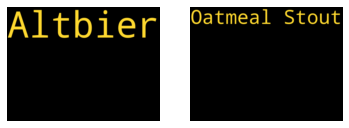

In [45]:
# teraz mozemy zwizualizowac nasze segmentacje za pomoca word clouds
#   zauwaz, jak roznia sie obie metody opisow segmentow oraz opisy miedzy poszczegolnymi segmentami

def visualise_styles(most_popular, most_distinctive, segment_id):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    wordcloud1 = WordCloud(width = 1000, height = 750, random_state=42, background_color='black', colormap='Set2', collocations=False)
    wordcloud1.generate_from_frequencies(frequencies=most_popular[segment_id])
    ax1.imshow(wordcloud1, interpolation="bilinear")
    wordcloud2 = WordCloud(width = 1000, height = 750, random_state=42, background_color='black', colormap='Set2', collocations=False)
    wordcloud2.generate_from_frequencies(frequencies=most_distinctive[segment_id])
    ax2.imshow(wordcloud2, interpolation="bilinear")
    ax1.axis("off")
    ax2.axis("off")
    plt.show()
    
visualise_styles(most_popular, most_distinctive, 3)